In [0]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

In [3]:
#Upload images
from google.colab import files
uploaded = files.upload()

Saving building_5.jpg to building_5.jpg
Saving building_1.jpg to building_1.jpg
Saving building_2.jpg to building_2.jpg
Saving building_3.jpg to building_3.jpg
Saving building_4.jpg to building_4.jpg


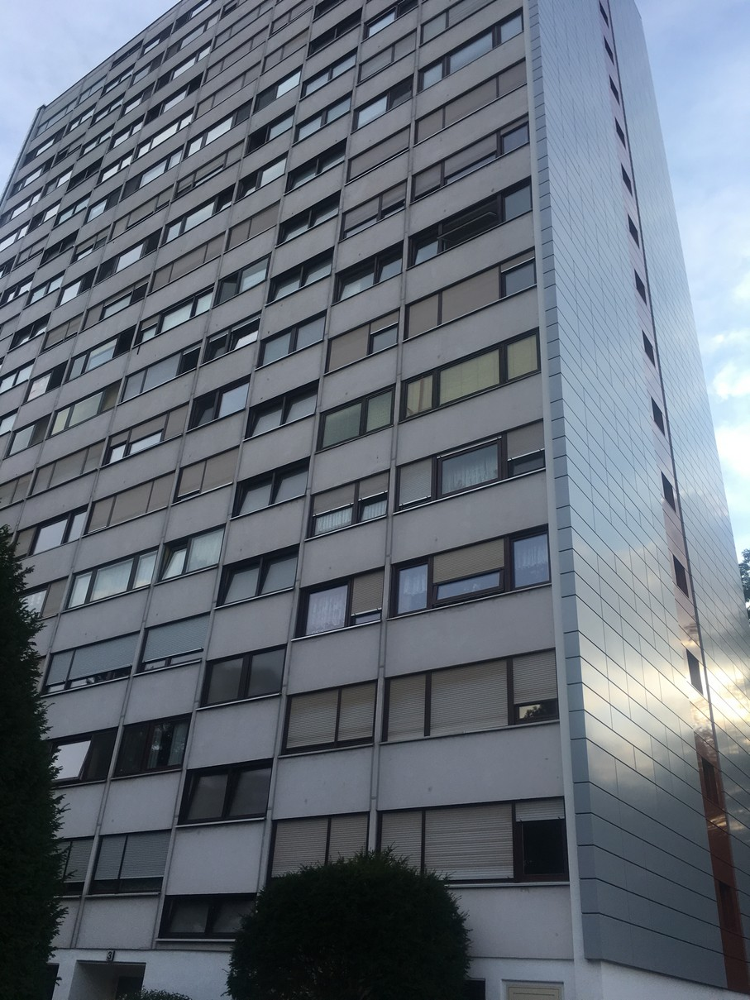

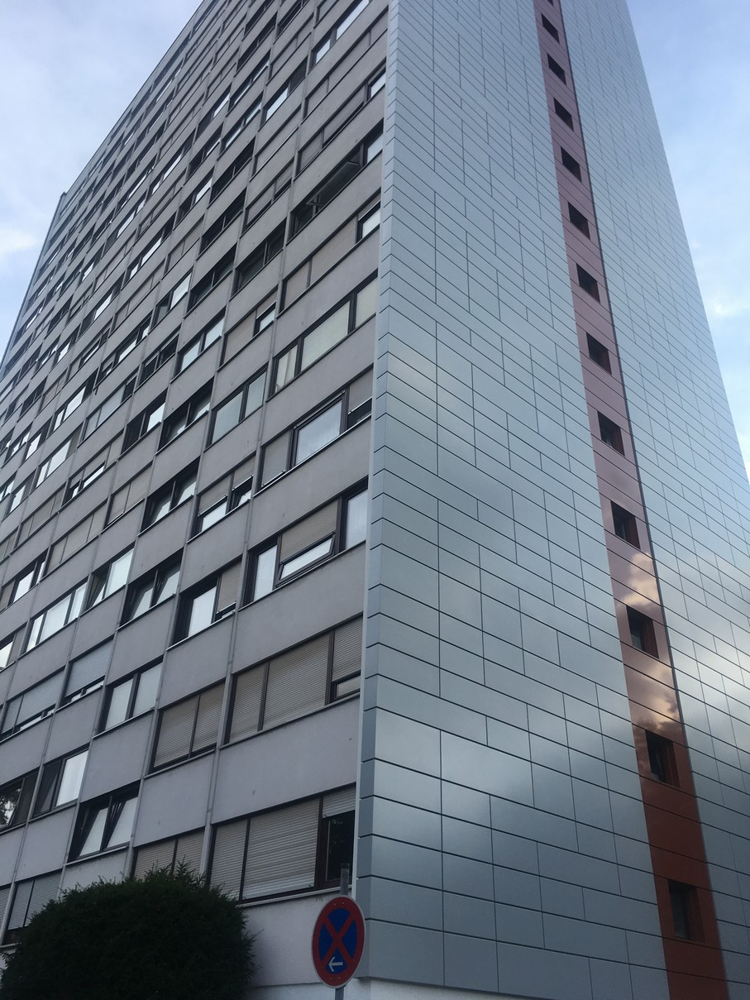

In [4]:
# browse sample images
cv2_imshow(cv2.imread("building_1.jpg"))
cv2_imshow(cv2.imread("building_2.jpg"))


In [0]:
# point are taken manually from first two images
p_building_1 = np.array([[676, 869], [464, 819], [666, 704], [473, 681], [659, 564], [478, 564], [654, 450], [485, 461]])
p_building_2 = np.array([[440, 835], [283, 815], [448, 650], [301, 666], [452, 499], [318, 541], [462, 373], [330, 432]])

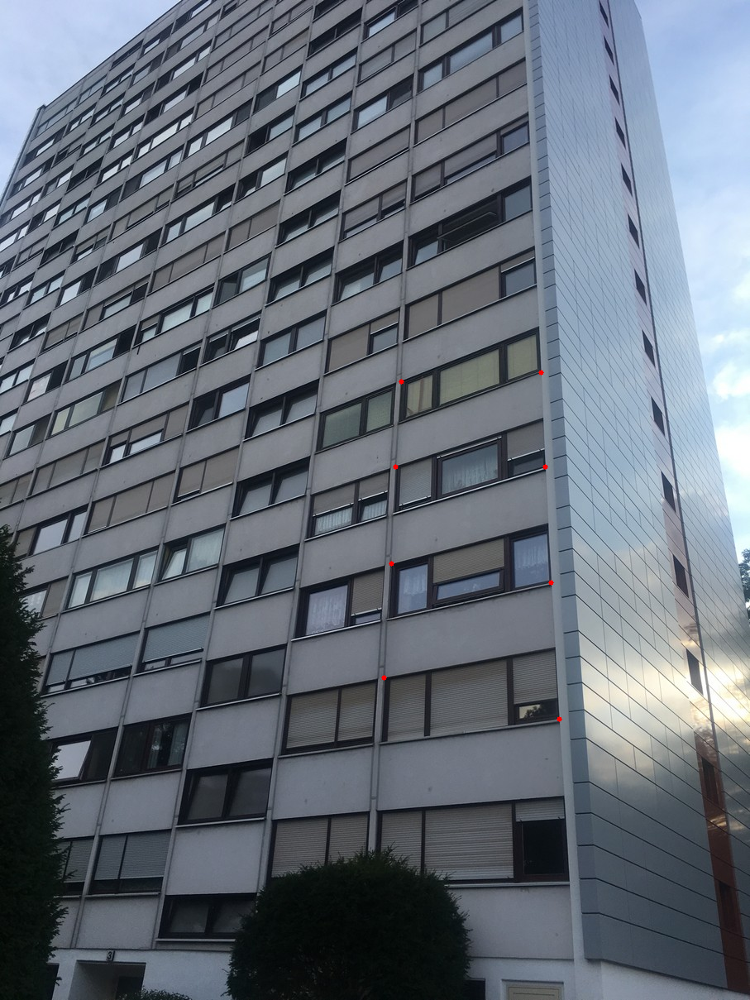

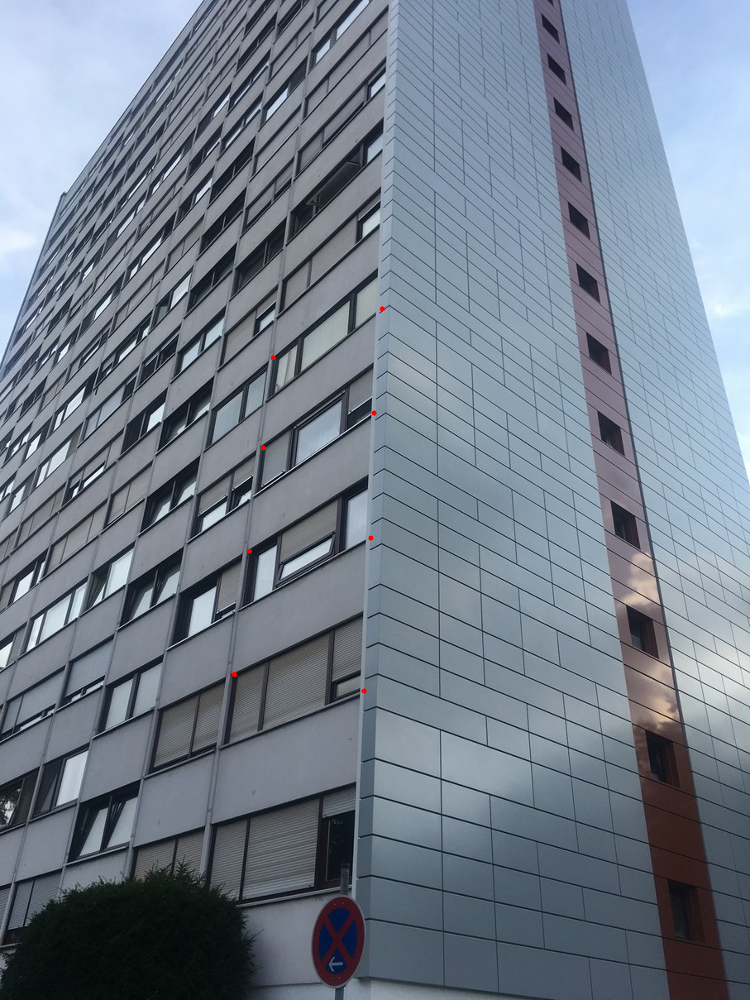

In [12]:
# Lets visualize the points
def drawCircles(img, points):
  for point in points:
    cv2.circle(img, (point[0], point[1]), 3, (0,0,255), -1)
  cv2_imshow(img)

building_1 = cv2.imread("building_1.jpg")
building_2 = cv2.imread("building_2.jpg")

drawCircles(building_1, p_building_1)
drawCircles(building_2, p_building_2)


In [33]:
# Lets find fundamental matrix
F, mask = cv2.findFundamentalMat(p_building_1,p_building_2,cv2.FM_LMEDS)

print("Fundamental matrix: \n",F)

# We select only inlier points
p_1 = p_building_1[mask.ravel()==1]
p_2 = p_building_2[mask.ravel()==1]

Fundamental matrix: 
 [[-1.53212966e-05  7.50104121e-05 -3.87762056e-02]
 [-4.91567119e-05  6.64242714e-06  9.61508295e-03]
 [ 3.19112954e-02 -1.69571477e-02  1.00000000e+00]]


In [0]:
def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    # print(img1.shape)
    r,c, _ = img1.shape
    # img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    # img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2

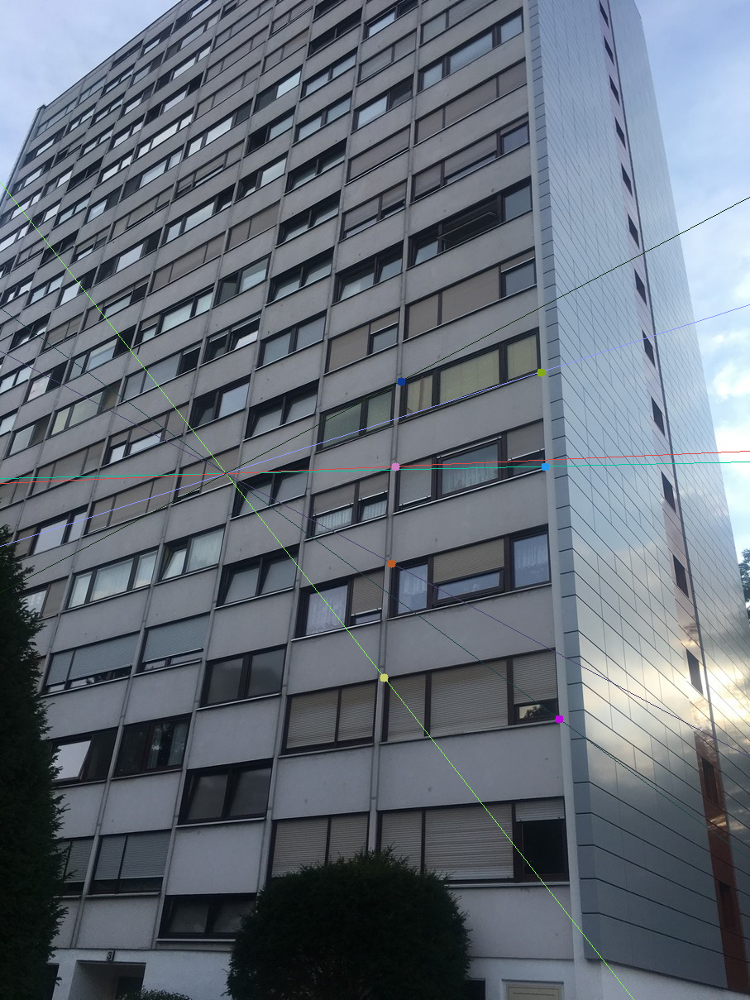

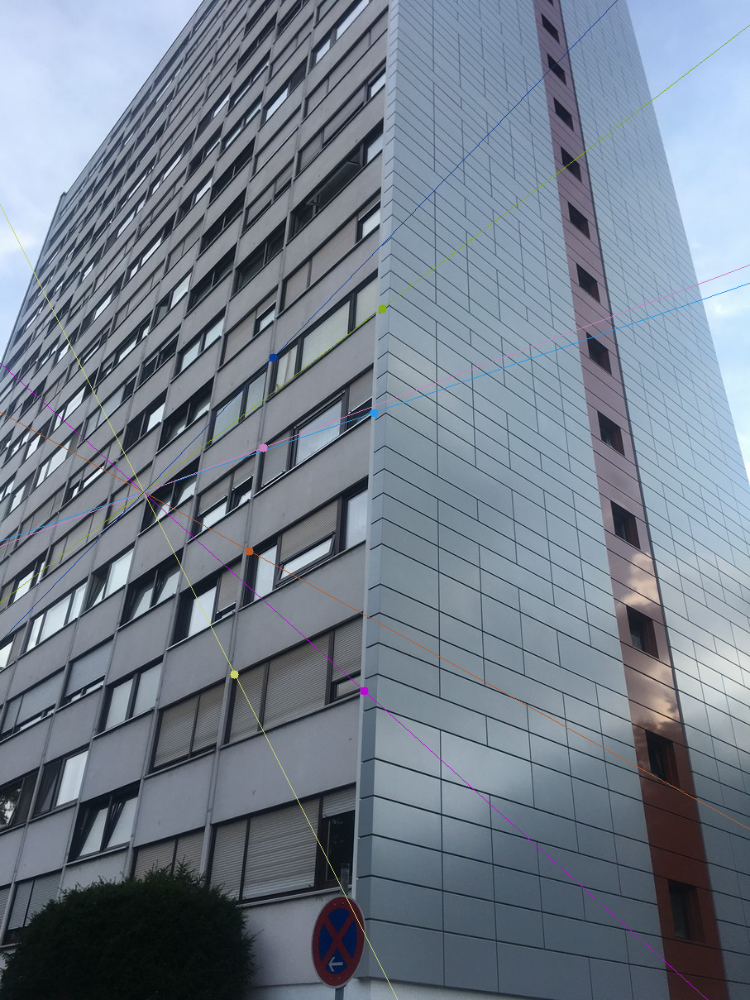

In [31]:
building_1 = cv2.imread("building_1.jpg")
building_2 = cv2.imread("building_2.jpg")

# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(p_2.reshape(-1,1,2), 2,F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(building_1,building_2,lines1,p_1,p_2)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(p_1.reshape(-1,1,2), 1,F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(building_2,building_1,lines2,p_2,p_1)

cv2_imshow(img5)
cv2_imshow(img6)